In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

In [2]:
df_summary = pd.read_csv('../References/London_Multiplex_Transport/Dataset/london_transport_disruptions_summary.txt', sep = ' ', engine='python')
df_summary.head(5)

,#DISRUP_ID,LAYER,STATION_A,STATION_B,FREQUENCY%,DAMAGED_NODES%
0,DISR1,metropolitan,aldgate,bakerstreet,3.3457,2.439
1,DISR2,hammersmith&city,barking,moorgate,2.8914,3.523
2,DISR3,dlr,beckton,canningtown,2.5609,2.439
3,DISR4,overground,claphamjunction,surreyquays,2.0240,1.897
4,DISR5,overground,richmond,willesdenjunction,1.9413,1.626


In [3]:
nodes_df = pd.read_csv('../References/London_Multiplex_Transport/Dataset/london_transport_nodes.txt', sep = ' ', engine='python')
nodes_df.head(5)

,nodeID,nodeLabel,nodeLat,nodeLong
0,0,abbeyroad,51.531952,0.003738
1,1,westham,51.528526,0.005332
2,2,actoncentral,51.508758,-0.263416
3,3,willesdenjunction,51.532234,-0.243895
4,4,actontown,51.503071,-0.280288


In [4]:
layers = pd.read_csv('../References/London_Multiplex_Transport/Dataset/london_transport_layers.txt', sep = ' ', engine='python')
layers.head(5)

,,,,layerID,layerLabel
1,Tube,(All,underground,lines,aggregated)
2,Overground,NaN,NaN,None,None
3,DLR,NaN,NaN,None,None


In [5]:
edges_file = '../References/London_Multiplex_Transport/Dataset/london_transport_raw.edges'
edges_df = pd.read_csv(edges_file, sep=' ', names=['Line', 'From Station', 'To Station'])

In [6]:
edges_df

,Line,From Station,To Station
0,bakerloo,harrow&wealdstone,kenton
1,bakerloo,kenton,southkenton
2,bakerloo,southkenton,northwembley
3,bakerloo,northwembley,wembleycentral
4,bakerloo,wembleycentral,stonebridgepark
...,...,...,...
498,dlr,poplar,blackwall
499,dlr,blackwall,eastindia
500,dlr,eastindia,canningtown
501,dlr,bank,shadwell


### Creating functions to assign line_color and line_stations

In [7]:
def assign_line_colors(edges_df):
    line_colors = {
        'bakerloo': 'brown',
        'circle': 'yellow',
        'district': 'green',
        'hammersmith&city': 'pink',
        'jubilee': 'gray',
        'metropolitan': 'magenta',
        'northern': 'black',
        'piccadilly': 'blue',
        'victoria': 'lightblue',
        'waterloo&city': 'cyan',
        'overground': 'orange',
        'dlr': 'turquoise',
        'central': 'red'  # Adding Central line for completeness
        
    }
    
    line_stations = {}
    for line in line_colors:
        line_stations[line] = set(edges_df[edges_df['Line'] == line]['From Station']).union(set(edges_df[edges_df['Line'] == line]['To Station']))
    
    return line_colors, line_stations

In [8]:
line_colors, line_stations = assign_line_colors(edges_df)

### Plotting the TfL Network

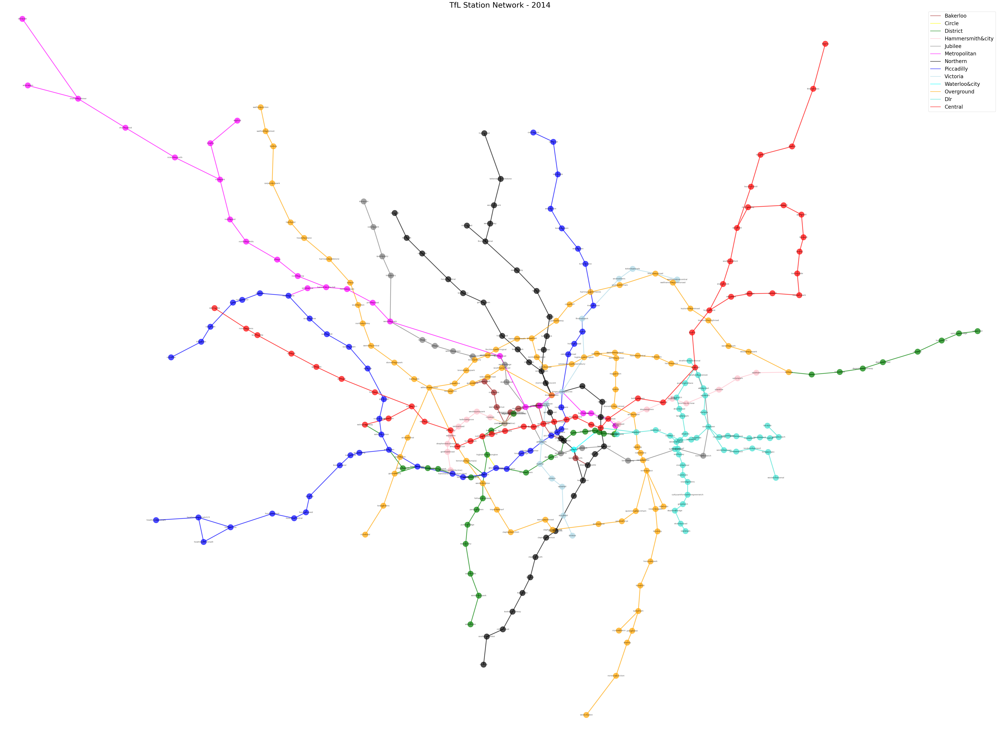

In [9]:
G = nx.Graph()

# Add nodes with positions
pos = {}
for _, row in nodes_df.iterrows():
    pos[row['nodeLabel']] = (row['nodeLong'], row['nodeLat'])

# Add nodes with colors
node_color_map = {}
for line, stations in line_stations.items():
    for station in stations:
        G.add_node(station)
        if station in pos:
            node_color_map[station] = line_colors[line]
        else:
            node_color_map[station] = 'gray'  # Station not in nodes_df

# Add edges with colors
for _, row in edges_df.iterrows():
    line = row['Line']
    if row['From Station'] in line_stations[line] and row['To Station'] in line_stations[line]:
        G.add_edge(row['From Station'], row['To Station'], color=line_colors[line])
    else:
        G.add_edge(row['From Station'], row['To Station'], color='gray')  # Edge not valid

# Draw the graph
plt.figure(figsize=(55, 40))
nx.draw(G, pos, with_labels=True, node_size=500, font_size=8, node_color=list(node_color_map.values()), font_color='black', edge_color=[G[u][v]['color'] for u, v in G.edges()], width=3, alpha=0.7)

# Create custom legend for line colors
legend_patches = []
for line, color in line_colors.items():
    legend_patches.append(plt.Line2D([], [], color=color, label=line.capitalize(), linestyle='-'))

plt.legend(handles=legend_patches, fontsize=20)
plt.xlim(-0.63, 0.27)
plt.ylim(51.37, 51.71)
plt.title('TfL Station Network - 2014', fontsize=30)
plt.show()

### Calculating centrality measures

In [10]:
def calculate_degree_centrality(G):
    dc = nx.degree_centrality(G)
    top_5 = sorted(dc.items(), key=lambda x: x[1], reverse=True)[:5]
    return dc, top_5

def calculate_betweenness_centrality(G):
    bc = nx.betweenness_centrality(G)
    top_5 = sorted(bc.items(), key=lambda x: x[1], reverse=True)[:5]
    return bc, top_5

def calculate_closeness_centrality(G):
    cc = nx.closeness_centrality(G)
    top_5 = sorted(cc.items(), key=lambda x: x[1], reverse=True)[:5]
    return cc, top_5

def calculate_eigenvector_centrality(G):
    ec = nx.eigenvector_centrality(G)
    top_5 = sorted(ec.items(), key=lambda x: x[1], reverse=True)[:5]
    return ec, top_5

def calculate_pagerank_centrality(G):
    pr = nx.pagerank(G)
    top_5 = sorted(pr.items(), key=lambda x: x[1], reverse=True)[:5]
    return pr, top_5

In [15]:
def plot_centrality(G, pos, node_color_map, line_colors, centrality_measure, top_5_nodes):
    plt.figure(figsize=(55, 40))
    
    # Draw all nodes and edges in grey
    nx.draw(G, pos, with_labels=True, node_size=500, font_size=8, 
            node_color='lightgrey', font_color='black', 
            edge_color='lightgrey', width=2, alpha=0.8)
    
    # Highlight top 5 nodes in red
    top_5_nodes_set = set(node for node, _ in top_5_nodes)
    nx.draw_networkx_nodes(G, pos, nodelist=top_5_nodes_set, node_size=1000, 
                           node_color='red', alpha=0.9)
    nx.draw_networkx_labels(G, pos, {node: node for node in top_5_nodes_set}, 
                            font_size=12, font_weight='bold')
    
    # Highlight edges from top 5 nodes in red
    edges_to_highlight = [(u, v) for (u, v) in G.edges() if u in top_5_nodes_set or v in top_5_nodes_set]
    nx.draw_networkx_edges(G, pos, edgelist=edges_to_highlight, edge_color='red', width=2, 
                                   alpha=0.8)

    # Create custom legend for line colors (optional, you may want to remove this)
    legend_patches = []
    for line, color in line_colors.items():
        legend_patches.append(plt.Line2D([], [], color=color, label=line.capitalize(), linestyle='-'))

    plt.legend(handles=legend_patches, fontsize=20)
    plt.xlim(-0.63, 0.27)
    plt.ylim(51.37, 51.71)
    plt.title(f'TfL Station Network - 2014\n{centrality_measure} Centrality', fontsize=30)
    plt.show()

[('bakerstreet', 0.019021739130434784), ('kingscrossstpancras', 0.019021739130434784), ('stratford', 0.019021739130434784), ('waterloo', 0.016304347826086956), ('paddington', 0.016304347826086956)]


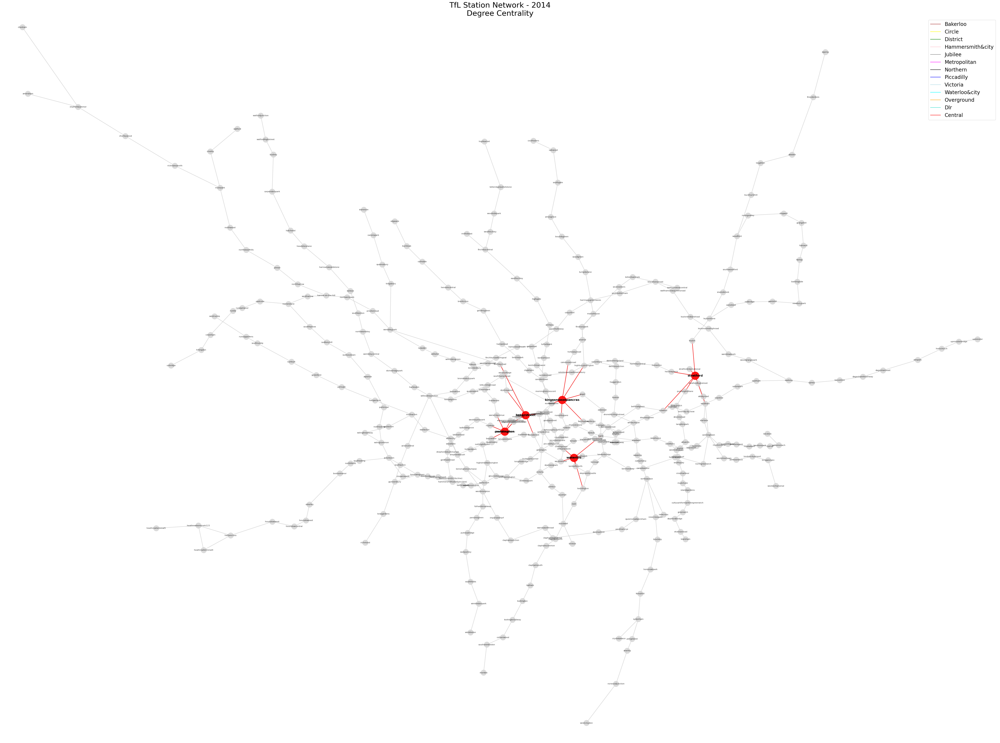

[('bank', 0.23987714098482918), ('waterloo', 0.22548275925393568), ('kingscrossstpancras', 0.22335320232525857), ('greenpark', 0.2198197339820075), ('bakerstreet', 0.21915043621261734)]


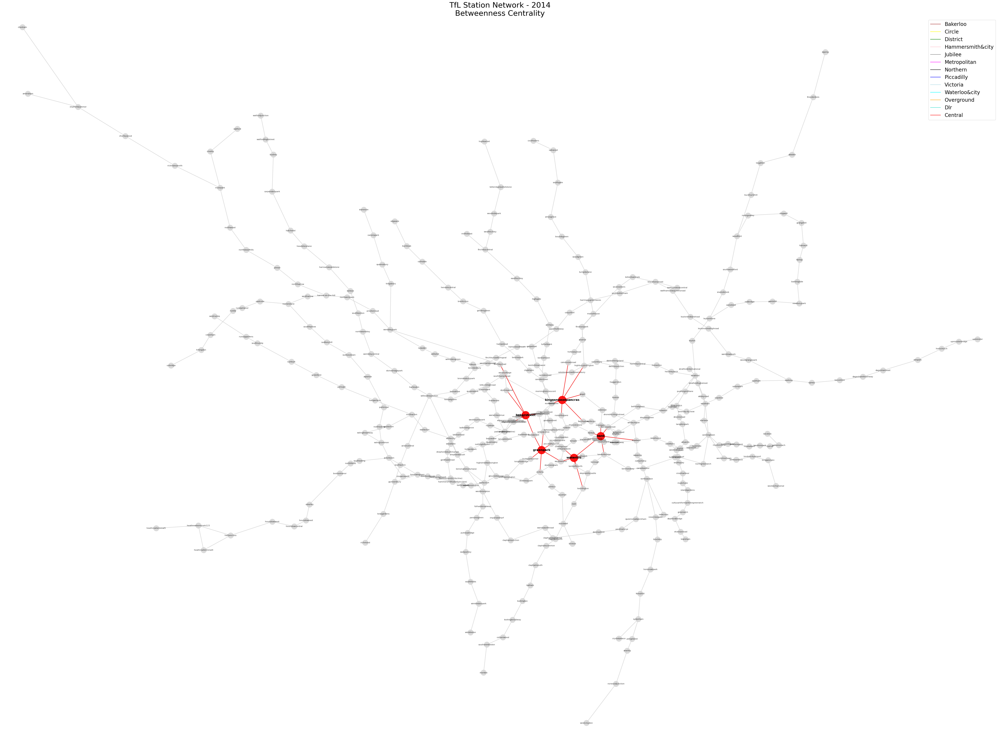

[('greenpark', 0.11295273173726213), ('westminster', 0.11004784688995216), ('bondstreet', 0.10994920824619062), ('kingscrossstpancras', 0.10988354732756046), ('oxfordcircus', 0.10952380952380952)]


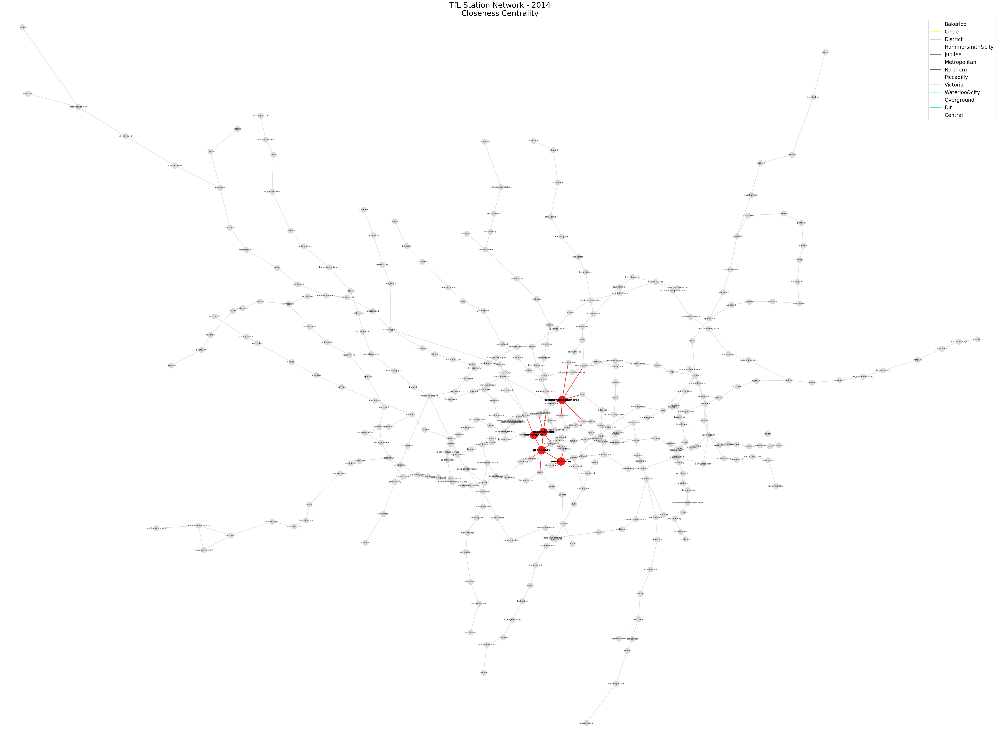

[('oxfordcircus', 0.3968157978956346), ('greenpark', 0.3903624311661707), ('piccadillycircus', 0.30975629560797274), ('bondstreet', 0.2835513647087156), ('westminster', 0.22314485167327802)]


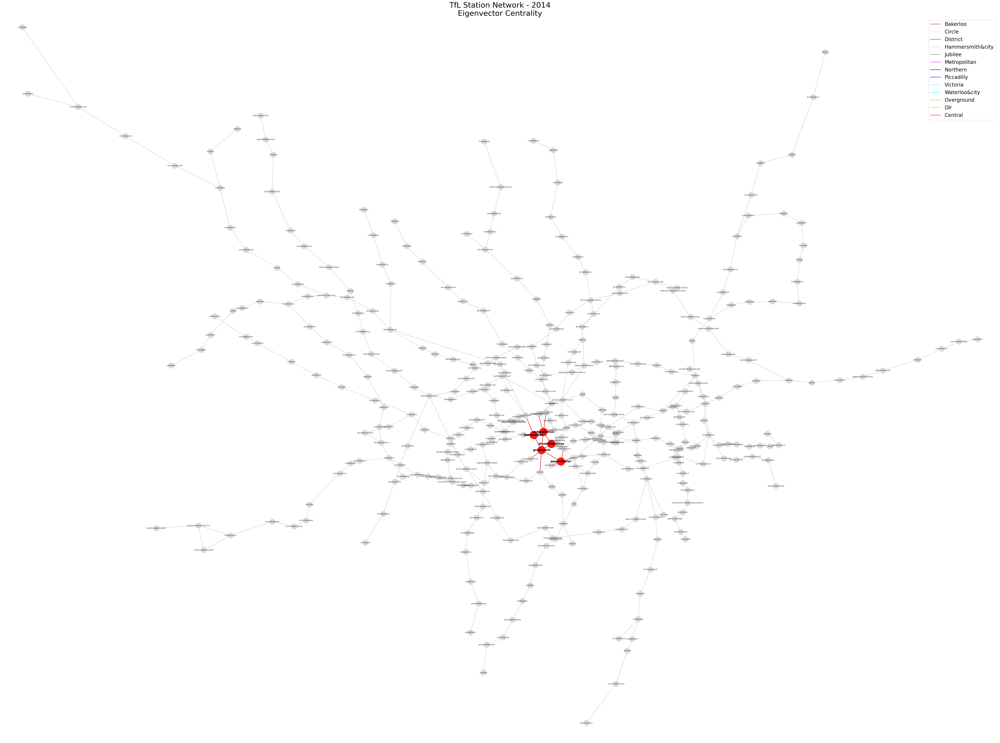

[('stratford', 0.006848834476307878), ('kingscrossstpancras', 0.0063662557647093), ('bakerstreet', 0.006109027217569682), ('paddington', 0.005900841200001562), ('canningtown', 0.005836020535399947)]


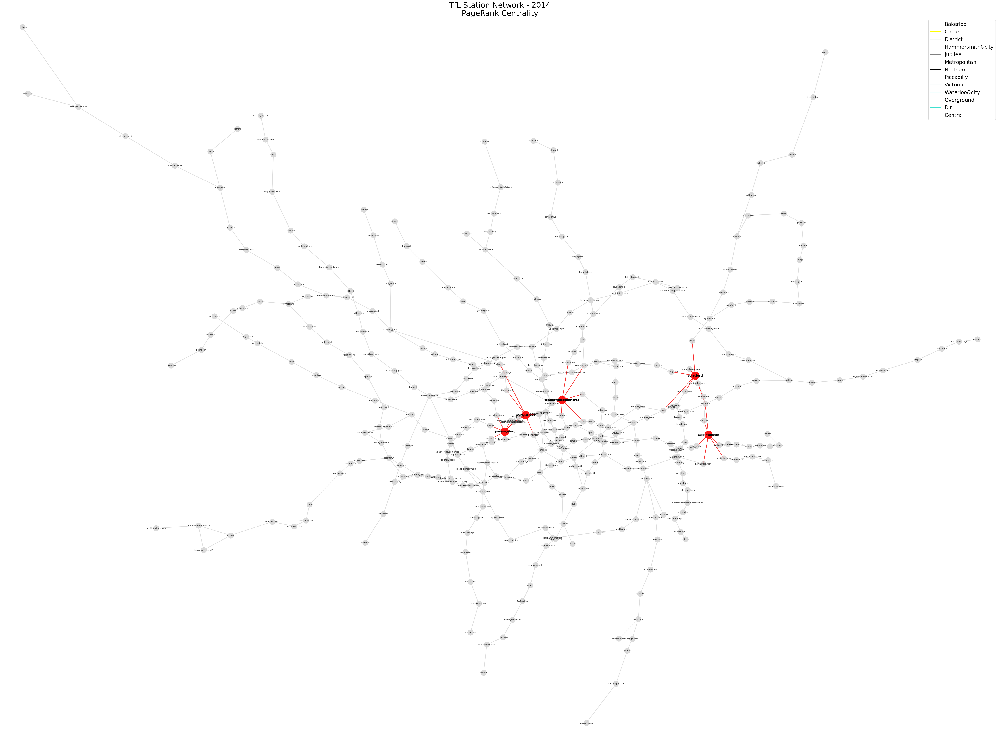

In [16]:
# Calculate centrality measures
degree_centrality, top_5_degree = calculate_degree_centrality(G)
betweenness_centrality, top_5_betweenness = calculate_betweenness_centrality(G)
closeness_centrality, top_5_closeness = calculate_closeness_centrality(G)
eigenvector_centrality, top_5_eigenvector = calculate_eigenvector_centrality(G)
pagerank_centrality, top_5_pagerank = calculate_pagerank_centrality(G)

# Plot centrality measures
print(top_5_degree)
plot_centrality(G, pos, node_color_map, line_colors, "Degree", top_5_degree)
print(top_5_betweenness)
plot_centrality(G, pos, node_color_map, line_colors, "Betweenness", top_5_betweenness)
print(top_5_closeness)
plot_centrality(G, pos, node_color_map, line_colors, "Closeness", top_5_closeness)
print(top_5_eigenvector)
plot_centrality(G, pos, node_color_map, line_colors, "Eigenvector", top_5_eigenvector)
print(top_5_pagerank)
plot_centrality(G, pos, node_color_map, line_colors, "PageRank", top_5_pagerank)

### Combining the top nodes and calculating the centrality measure

In [17]:
def combine_top_nodes(top_nodes_lists):
    all_nodes = {}
    for measure, nodes in top_nodes_lists.items():
        for i, (node, score) in enumerate(nodes):
            if node not in all_nodes:
                all_nodes[node] = {'total_score': 0, 'appearances': 0}
            all_nodes[node]['total_score'] += (5 - i)  # 5 points for 1st, 4 for 2nd, etc.
            all_nodes[node]['appearances'] += 1
    
    # Calculate a combined score: total_score * (appearances / 5)
    for node in all_nodes:
        all_nodes[node]['combined_score'] = all_nodes[node]['total_score'] * (all_nodes[node]['appearances'] / 5)
    
    # Sort by combined score and return top 5
    return sorted(all_nodes.items(), key=lambda x: x[1]['combined_score'], reverse=True)[:5]

Top 5 nodes across all centrality measures:
1. kingscrossstpancras - Combined Score: 10.40, Appearances: 4
2. greenpark - Combined Score: 6.60, Appearances: 3
3. bakerstreet - Combined Score: 5.40, Appearances: 3
4. stratford - Combined Score: 3.20, Appearances: 2
5. waterloo - Combined Score: 2.40, Appearances: 2


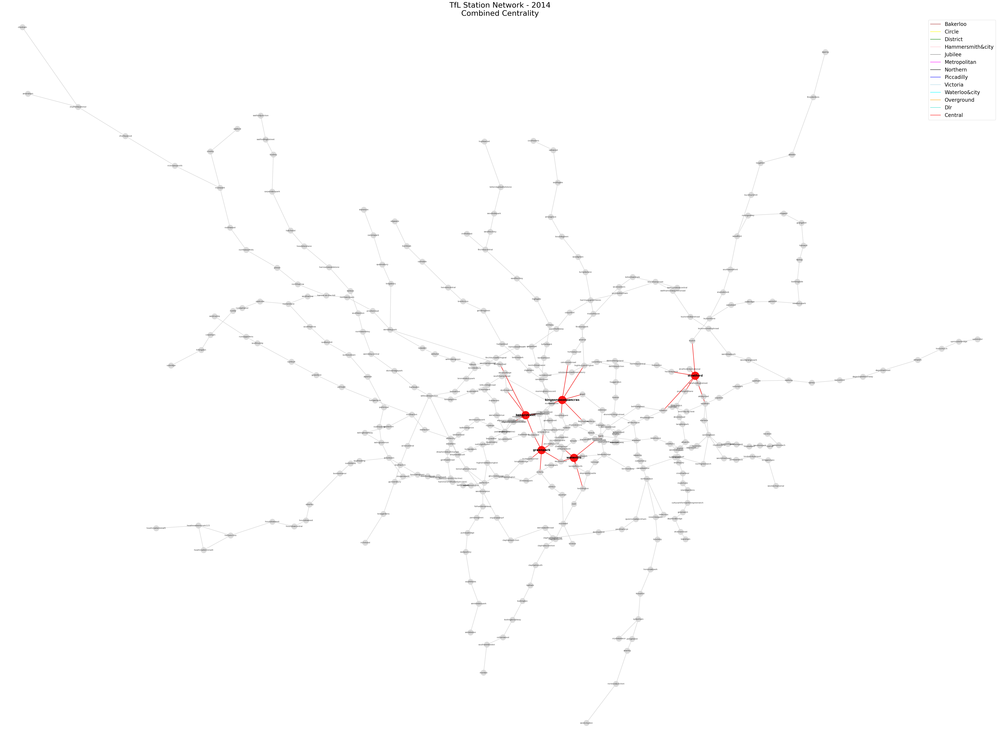

In [18]:
top_nodes_lists = {
    "Degree": top_5_degree,
    "Betweenness": top_5_betweenness,
    "Closeness": top_5_closeness,
    "Eigenvector": top_5_eigenvector,
    "PageRank": top_5_pagerank
}

combined_top_5 = combine_top_nodes(top_nodes_lists)

print("Top 5 nodes across all centrality measures:")
for i, (node, data) in enumerate(combined_top_5, 1):
    print(f"{i}. {node} - Combined Score: {data['combined_score']:.2f}, Appearances: {data['appearances']}")

# Plot combined top 5
plot_centrality(G, pos, node_color_map, line_colors, "Combined", combined_top_5)